In [7]:
import pandas as pd
import numpy as np
import seaborn as sns 
import sklearn as sk
import matplotlib.pyplot as plt

<b>Now we are performing EDA (Multivariate) hence we need to see relationships between variables, the best way to fo this is by CORRELATION HEATMAP : </b>


In [9]:
data = pd.read_csv("/Users/naeem/Downloads/processed_dataset.csv")

In [11]:
numerical_data = data.select_dtypes(include=['float64', 'int64'])

In [13]:
correlation_matrix = numerical_data.corr()

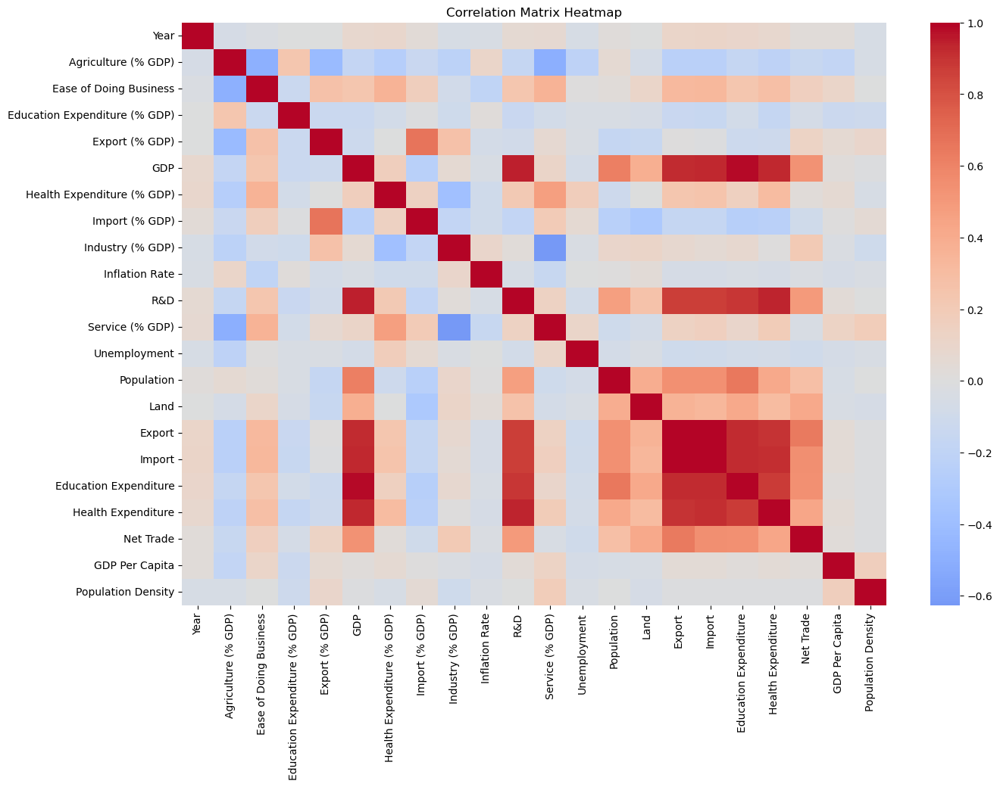

In [15]:
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0)
plt.title("Correlation Matrix Heatmap")
plt.show()

<b>Export and Import show a very high positive correlation, which indicates that countries with higher exports also tend to have higher imports, suggesting trade-dependent economies.
GDP and Education Expenditure are also strongly positively correlated, which might imply that higher GDPs are associated with increased education spending. </b>

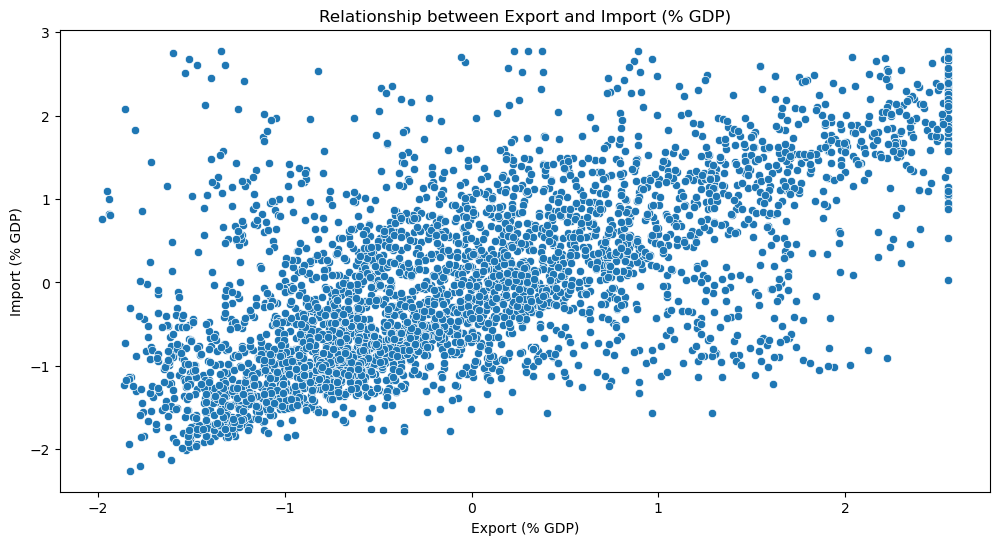

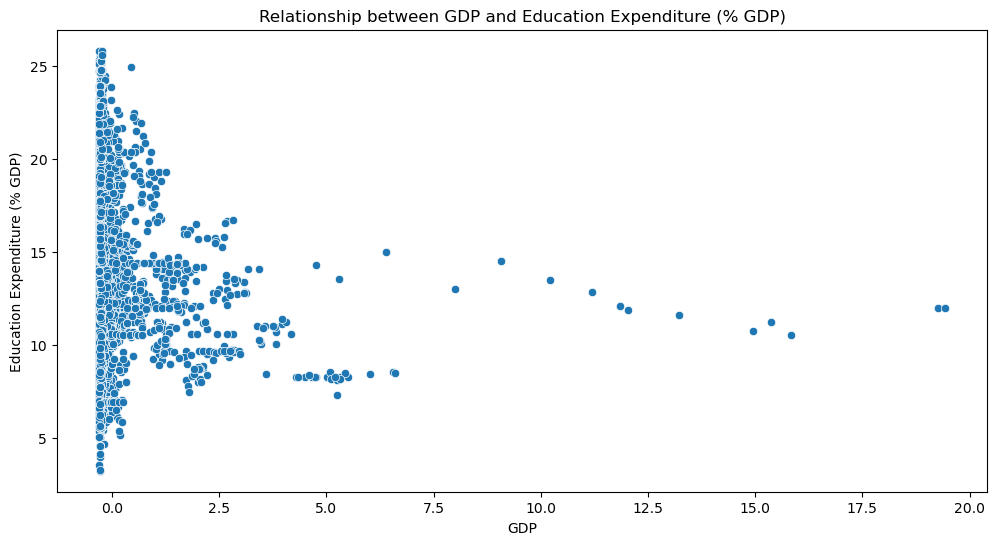

In [18]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x='Export (% GDP)', y='Import (% GDP)', data=numerical_data)
plt.title('Relationship between Export and Import (% GDP)')
plt.xlabel('Export (% GDP)')
plt.ylabel('Import (% GDP)')
plt.show()


plt.figure(figsize=(12, 6))
sns.scatterplot(x='GDP', y='Education Expenditure (% GDP)', data=numerical_data)
plt.title('Relationship between GDP and Education Expenditure (% GDP)')
plt.xlabel('GDP')
plt.ylabel('Education Expenditure (% GDP)')
plt.show()


<b> Export vs. Import: The scatter plot shows a strong positive linear relationship between exports and imports, indicating that countries with higher export percentages tend to have higher import percentages. This makes sense as trade activities are usually reciprocal, with exporting countries often importing goods or resources in return.
GDP vs. Education Expenditure: The scatter plot indicates a positive relationship between GDP and education expenditure. This suggests that countries with higher GDPs tend to allocate a greater percentage of their GDP towards education.</b>

* Fitting Regression Lines: We'll fit regression lines to quantify the relationships and measure their strength using R-squared values.
* Group by Country or Region: We'll then check whether these relationships hold consistently across different regions or countries.

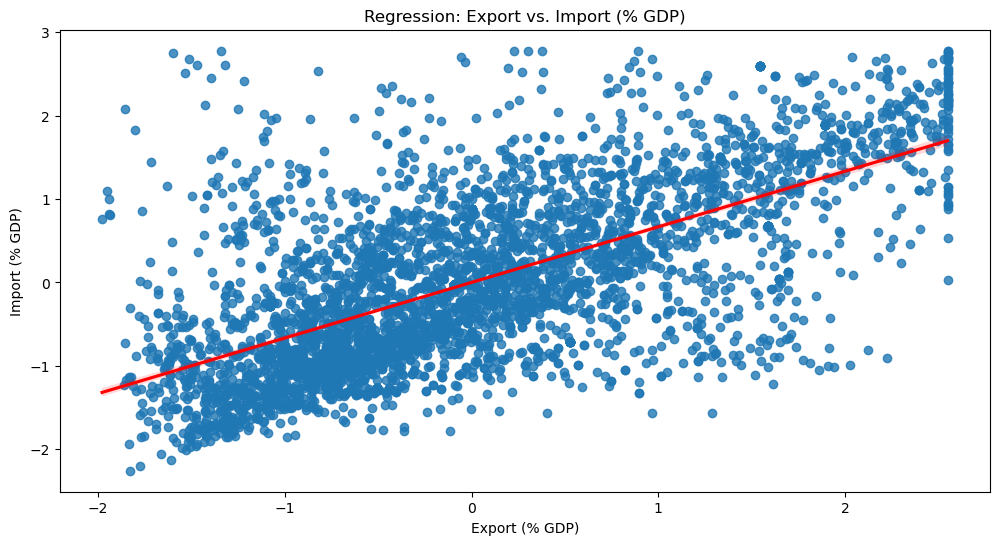

Export vs. Import: R-squared = 0.4436


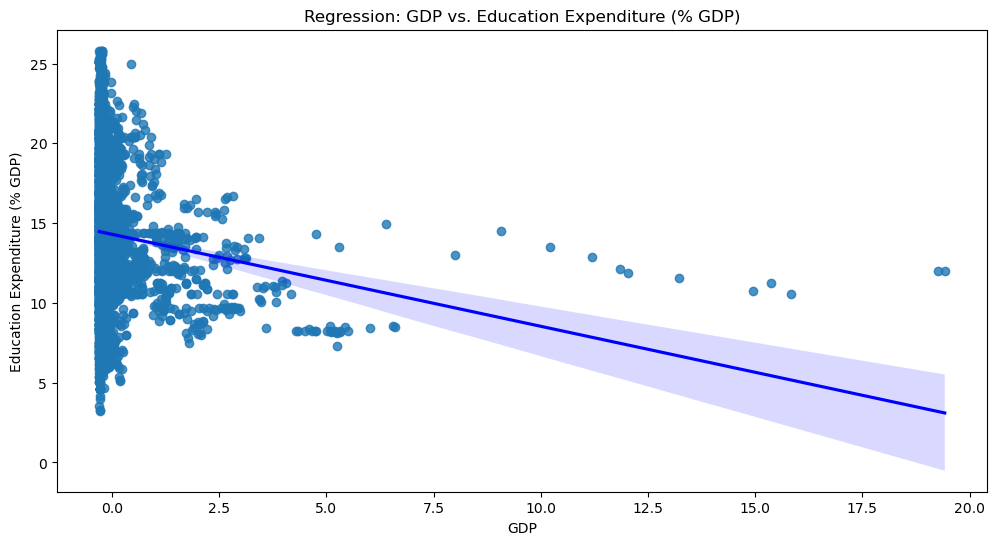

GDP vs. Education Expenditure: R-squared = 0.0181


In [26]:
from scipy.stats import linregress

# Plotting Export vs. Import with regression line
plt.figure(figsize=(12, 6))
sns.regplot(x='Export (% GDP)', y='Import (% GDP)', data=numerical_data, line_kws={"color": "red"})
plt.title('Regression: Export vs. Import (% GDP)')
plt.xlabel('Export (% GDP)')
plt.ylabel('Import (% GDP)')
plt.show()

# Regression analysis for Export vs. Import
slope, intercept, r_value, p_value, std_err = linregress(numerical_data['Export (% GDP)'], numerical_data['Import (% GDP)'])
print(f"Export vs. Import: R-squared = {r_value**2:.4f}")

# Plotting GDP vs. Education Expenditure with regression line
plt.figure(figsize=(12, 6))
sns.regplot(x='GDP', y='Education Expenditure (% GDP)', data=numerical_data, line_kws={"color": "blue"})
plt.title('Regression: GDP vs. Education Expenditure (% GDP)')
plt.xlabel('GDP')
plt.ylabel('Education Expenditure (% GDP)')
plt.show()

# Regression analysis for GDP vs. Education Expenditure
slope, intercept, r_value, p_value, std_err = linregress(numerical_data['GDP'], numerical_data['Education Expenditure (% GDP)'])
print(f"GDP vs. Education Expenditure: R-squared = {r_value**2:.4f}")


* Export vs. Import:
The regression line and R-squared value (0.4436) indicate a moderately strong positive relationship between export and import percentages. This suggests that while exports and imports move together, there are other factors influencing the relationship.

* GDP vs. Education Expenditure:
The R-squared value (0.0181) indicates a weak positive relationship between GDP and education expenditure. This suggests that the percentage of GDP allocated to education may not be strongly determined by the total GDP alone and could be influenced by other factors.

In [33]:
# Creating a simplified 'Continent' column based on continent-related columns
def get_continent(row):
    for col in continent_columns:
        if row[col] == True:  # Ensure we are checking for a boolean True
            return col.replace('Continent Name_', '')
    return 'Unknown'

# Check if the continent columns exist
continent_columns = [col for col in data.columns if col.startswith('Continent Name_')]
if continent_columns:
    data['Continent'] = data.apply(get_continent, axis=1)
else:
    raise ValueError("Continent-related columns are not present in the dataset.")

# Verify that the 'Continent' column is created successfully
print(data['Continent'].unique())



['Asia' 'Europe' 'Unknown' 'Oceania' 'North America' 'South America']


# Continental Analysis on Import vs Export & GDP vs Educational Expense 

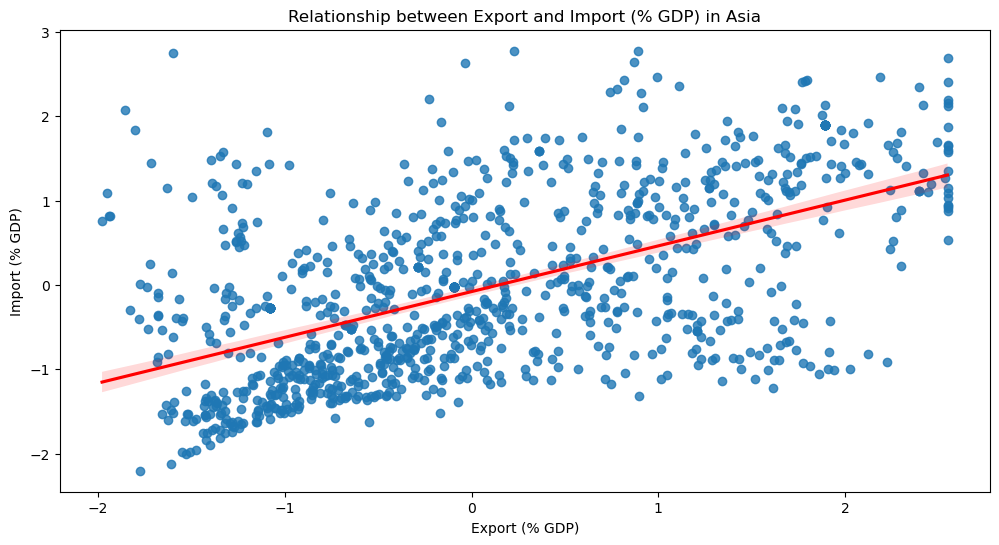

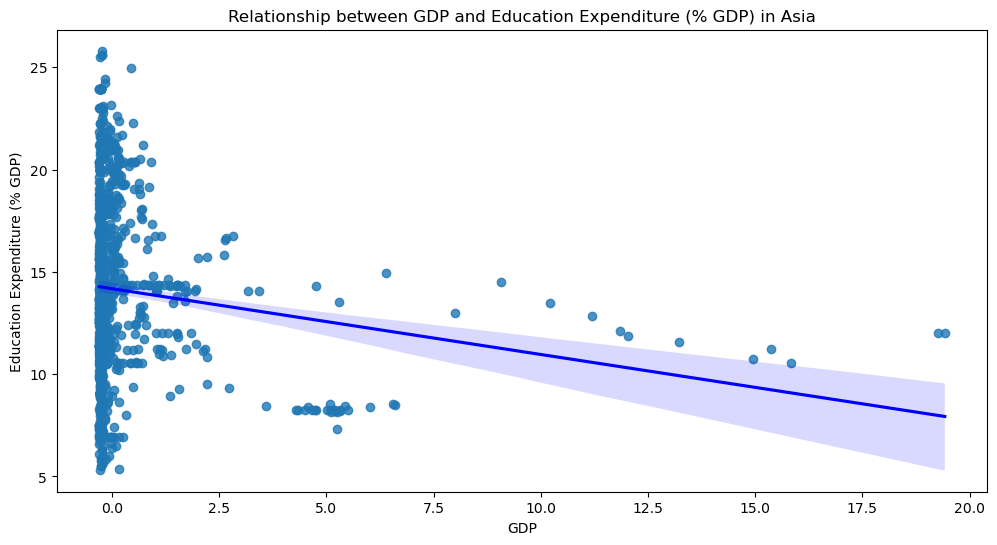

In [35]:

# Function to plot relationships for a specific continent
def plot_relationships_for_asia(data):
    # Filter the dataset for Asia
    asia_data = data[data['Continent'] == 'Asia']
    
    # Plot Export vs. Import relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='Export (% GDP)', y='Import (% GDP)', data=asia_data, line_kws={"color": "red"})
    plt.title('Relationship between Export and Import (% GDP) in Asia')
    plt.xlabel('Export (% GDP)')
    plt.ylabel('Import (% GDP)')
    plt.show()
    
    # Plot GDP vs. Education Expenditure relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='GDP', y='Education Expenditure (% GDP)', data=asia_data, line_kws={"color": "blue"})
    plt.title('Relationship between GDP and Education Expenditure (% GDP) in Asia')
    plt.xlabel('GDP')
    plt.ylabel('Education Expenditure (% GDP)')
    plt.show()

# Plot relationships specifically for Asia
plot_relationships_for_asia(data)


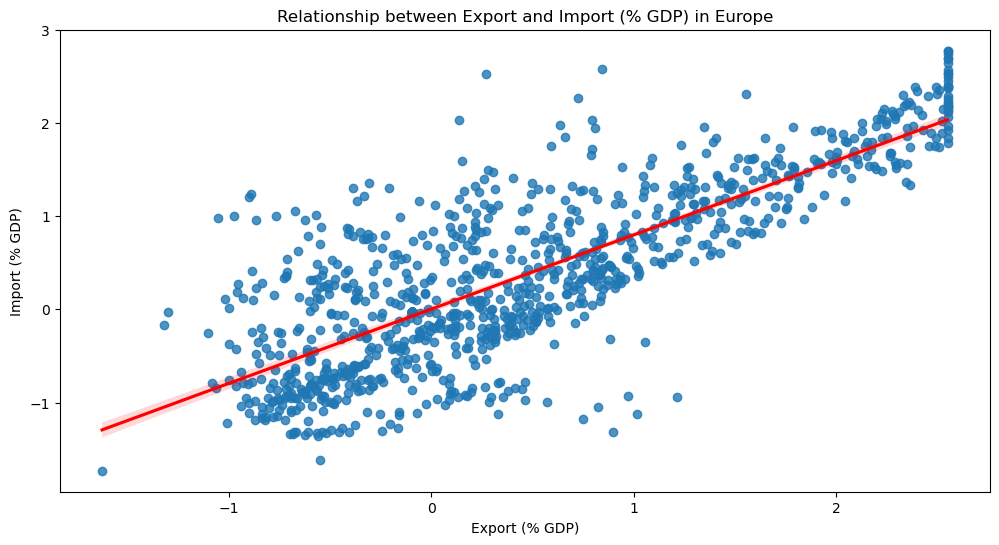

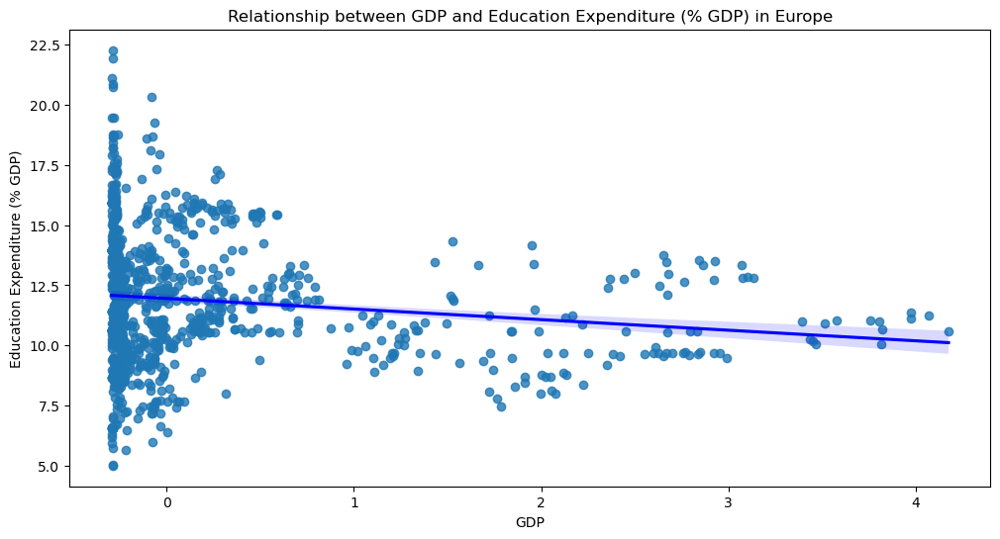

In [37]:

# Function to plot relationships for Europe
def plot_relationships_for_europe(data):
    # Filter the dataset for Europe
    europe_data = data[data['Continent'] == 'Europe']
    
    # Plot Export vs. Import relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='Export (% GDP)', y='Import (% GDP)', data=europe_data, line_kws={"color": "red"})
    plt.title('Relationship between Export and Import (% GDP) in Europe')
    plt.xlabel('Export (% GDP)')
    plt.ylabel('Import (% GDP)')
    plt.show()
    
    # Plot GDP vs. Education Expenditure relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='GDP', y='Education Expenditure (% GDP)', data=europe_data, line_kws={"color": "blue"})
    plt.title('Relationship between GDP and Education Expenditure (% GDP) in Europe')
    plt.xlabel('GDP')
    plt.ylabel('Education Expenditure (% GDP)')
    plt.show()

# Plot relationships specifically for Europe
plot_relationships_for_europe(data)


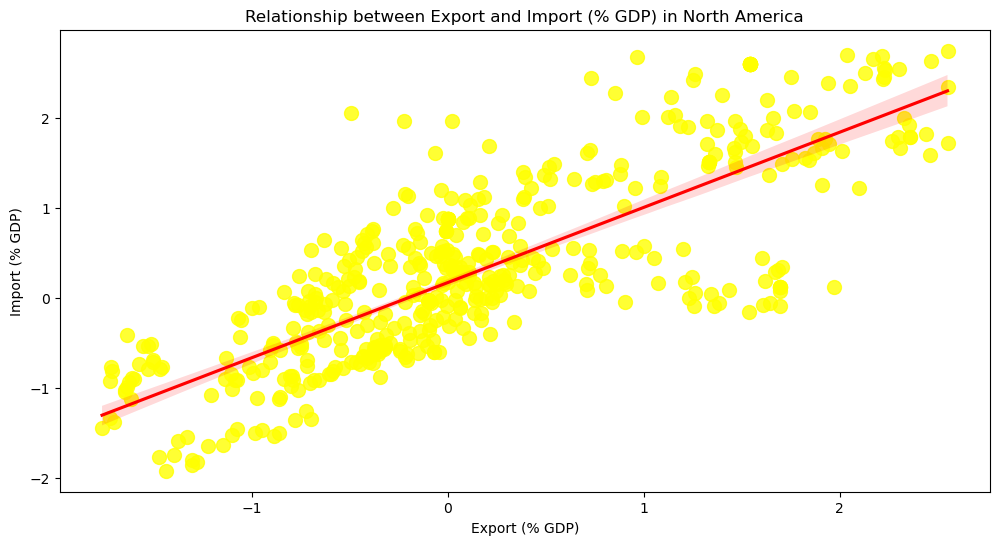

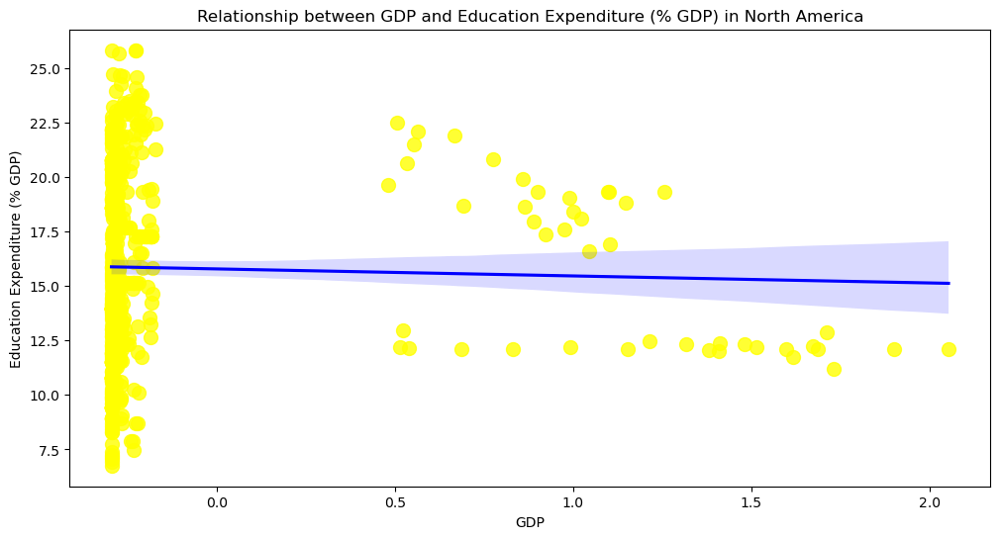

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot relationships for North America with customized markers and colors
def plot_relationships_for_north_america(data):
    # Filter the dataset for North America
    na_data = data[data['Continent'] == 'North America']
    
    # Plot Export vs. Import relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='Export (% GDP)', y='Import (% GDP)', data=na_data, 
                scatter_kws={'color': 'yellow', 's': 100, 'marker': '*'}, 
                line_kws={"color": "red"})
    plt.title('Relationship between Export and Import (% GDP) in North America')
    plt.xlabel('Export (% GDP)')
    plt.ylabel('Import (% GDP)')
    plt.show()
    
    # Plot GDP vs. Education Expenditure relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='GDP', y='Education Expenditure (% GDP)', data=na_data, 
                scatter_kws={'color': 'yellow', 's': 100, 'marker': '*'}, 
                line_kws={"color": "blue"})
    plt.title('Relationship between GDP and Education Expenditure (% GDP) in North America')
    plt.xlabel('GDP')
    plt.ylabel('Education Expenditure (% GDP)')
    plt.show()

# Plot relationships specifically for North America
plot_relationships_for_north_america(data)


In [49]:
# Use the existing 'Continent Name' column to create the 'Continent' column directly
data['Continent'] = data['Continent Name']

# Verify the unique values in the 'Continent' column
print("Unique continents after creation:", data['Continent'].unique())


Unique continents after creation: ['Asia' 'Europe' 'Africa' 'Oceania' 'North America' 'South America']


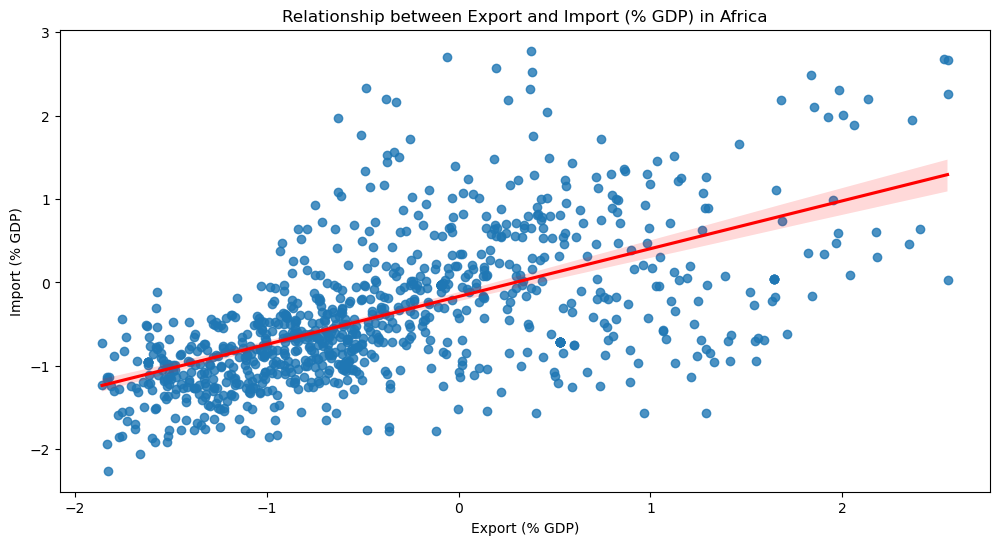

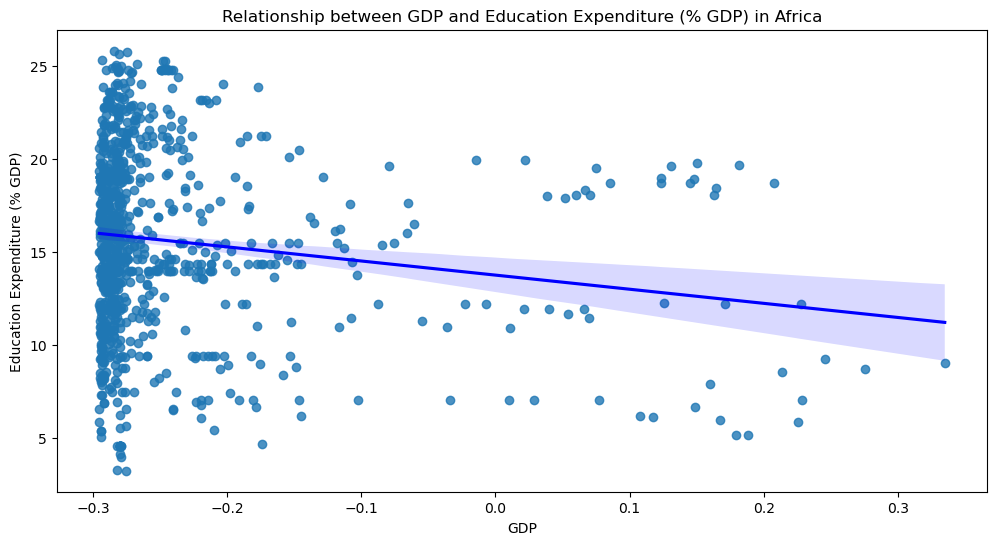

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot relationships for Africa
def plot_relationships_for_africa(data):
    # Filter the dataset for Africa
    africa_data = data[data['Continent'] == 'Africa']
    
    # Plot Export vs. Import relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='Export (% GDP)', y='Import (% GDP)', data=africa_data, line_kws={"color": "red"})
    plt.title('Relationship between Export and Import (% GDP) in Africa')
    plt.xlabel('Export (% GDP)')
    plt.ylabel('Import (% GDP)')
    plt.show()
    
    # Plot GDP vs. Education Expenditure relationship with regression line
    plt.figure(figsize=(12, 6))
    sns.regplot(x='GDP', y='Education Expenditure (% GDP)', data=africa_data, line_kws={"color": "blue"})
    plt.title('Relationship between GDP and Education Expenditure (% GDP) in Africa')
    plt.xlabel('GDP')
    plt.ylabel('Education Expenditure (% GDP)')
    plt.show()

# Plot relationships specifically for Africa
plot_relationships_for_africa(data)


* 1. Export vs. Import Relationship:
Positive Correlation Across Continents: There is a consistent positive relationship between Export (% GDP) and Import (% GDP) in Asia, Europe, North America, and Africa. This indicates strong trade interdependency and economic openness in these regions.
* Regional Variations:
Asia and Europe showed a strong correlation, highlighting their high levels of trade integration.
North America had some outliers, suggesting diverse trade policies among the US, Canada, and Mexico.
Africa displayed a weaker correlation, which may indicate trade barriers or varying levels of industrialization.
* 2. GDP vs. Education Expenditure Relationship:
Weak Correlation: Across all continents, the relationship between GDP and Education Expenditure (% GDP) was weak. This suggests that higher GDP doesn’t necessarily lead to a higher percentage of spending on education.
* Policy Differences: Education spending appears to be more influenced by national policies and demographics rather than purely by GDP size.

* Asia and Europe: Strong trade links and integrated economies with high trade dependency.
* Africa: Weaker trade correlations, indicating possible challenges like infrastructure and trade policies.
* North America: Some variability in trade dependency, likely due to diverse economic structures and strategies.


# Time Series Analysis now -


Unique continents included in the dataset: ['Asia' 'Europe' 'Africa' 'Oceania' 'North America' 'South America']


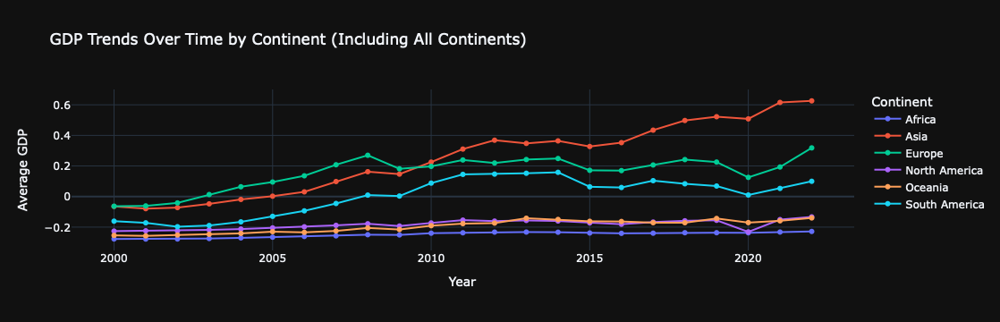

In [63]:
import plotly.express as px

# Step 1: Ensure all continents are included
# Create a new column called 'Continent' based on the existing 'Continent Name' column
data['Continent'] = data['Continent Name']

# Verify the unique values in the 'Continent' column
unique_continents = data['Continent'].unique()
print("Unique continents included in the dataset:", unique_continents)

# Step 2: Group data by 'Year' and 'Continent' to calculate average GDP
continent_gdp_trends = data.groupby(['Year', 'Continent'])['GDP'].mean().reset_index()

# Step 3: Create an interactive line plot using Plotly
fig = px.line(
    continent_gdp_trends,
    x='Year',
    y='GDP',
    color='Continent',
    markers=True,
    title='GDP Trends Over Time by Continent (Including All Continents)',
    labels={'GDP': 'Average GDP', 'Year': 'Year', 'Continent': 'Continent'},
    line_shape='linear'
)

# Customizing plot aesthetics
fig.update_layout(
    template='plotly_dark',
    legend_title_text='Continent',
    hovermode='x unified'
)

# Step 4: Show the plot
fig.show()


* Inferences from the Time-Series Plot:
* Steady Growth in Asia: The plot showed a consistent upward trend in GDP for Asia, indicating rapid and sustained economic growth. This is likely driven by the rise of major economies like China and India.
* Moderate but Stable Growth in Europe: Europe exhibited a steady increase in GDP, reflecting stability and gradual growth. This could be due to the established economies within the European Union.
* Stability with Minor Fluctuations in North America: The GDP trend in North America was relatively stable, suggesting mature economies with minimal volatility. The slight fluctuations could be attributed to cyclical economic changes.
* Fluctuations in Africa: Africa displayed more variability in GDP trends, suggesting periods of growth as well as economic instability. This variability might be due to differing political situations, economic policies, or resource-dependent economies in various African countries.

#  Cluster Analysis
* Why: Clustering can reveal hidden patterns and similarities among countries, offering insights into different economic and social development stages.

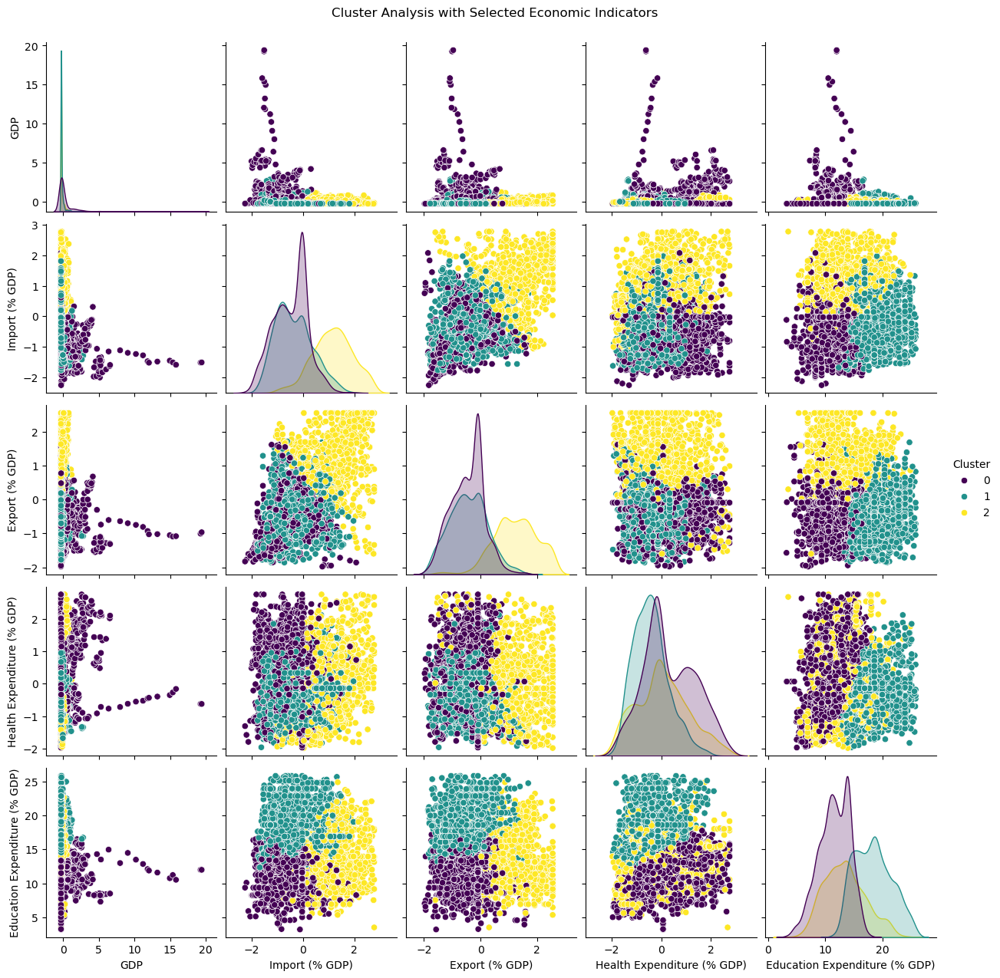

In [111]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

selected_columns = ['GDP', 'Import (% GDP)', 'Export (% GDP)', 'Health Expenditure (% GDP)', 'Education Expenditure (% GDP)']
clustering_data = data[selected_columns].dropna()

scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data)

kmeans = KMeans(n_clusters=3, random_state=42)
clustering_data['Cluster'] = kmeans.fit_predict(scaled_data)

sns.pairplot(clustering_data, hue='Cluster', palette='viridis', diag_kind='kde')
plt.suptitle("Cluster Analysis with Selected Economic Indicators", y=1.02)
plt.show()


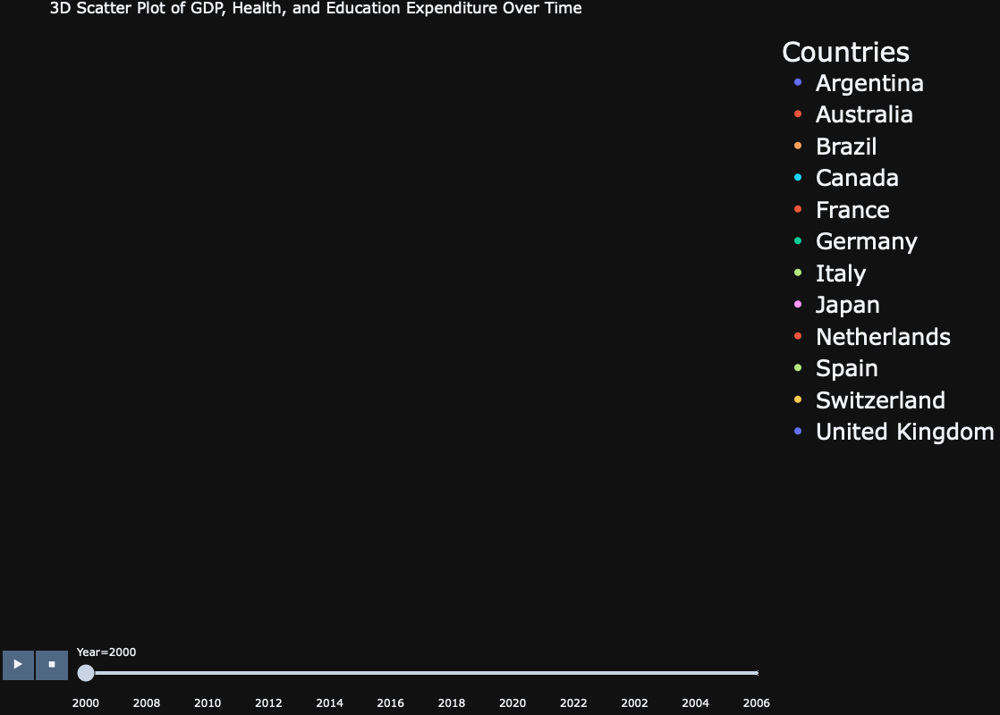

In [127]:
import plotly.express as px
import pandas as pd

# Load the dataset (assuming it is named 'data')
# Prepare the dataset by filtering necessary columns
data_filtered = data[['Country Name', 'Year', 'GDP', 'Health Expenditure (% GDP)', 'Education Expenditure (% GDP)']]

# Remove any negative or zero values that might cause issues in visualization
data_filtered = data_filtered[(data_filtered['GDP'] > 0) & 
                              (data_filtered['Health Expenditure (% GDP)'] > 0) & 
                              (data_filtered['Education Expenditure (% GDP)'] > 0)]

# Create a 3D scatter plot using Plotly without the size parameter
fig = px.scatter_3d(data_filtered,
                    x='GDP',
                    y='Health Expenditure (% GDP)',
                    z='Education Expenditure (% GDP)',
                    color='Country Name',
                    animation_frame='Year',
                    hover_name='Country Name',
                    title="3D Scatter Plot of GDP, Health, and Education Expenditure Over Time",
                    template='plotly_dark',
                    width=1200,  # Increased plot width
                    height=800)  # Increased plot height

# Update layout for better aesthetics and visibility
fig.update_layout(scene=dict(
                    xaxis=dict(title='GDP', titlefont=dict(size=14)),
                    yaxis=dict(title='Health Expenditure (% GDP)', titlefont=dict(size=14)),
                    zaxis=dict(title='Education Expenditure (% GDP)', titlefont=dict(size=14))),
                  legend=dict(title="Countries", font=dict(size=25)),
                  margin=dict(l=0, r=0, b=0, t=30),
                  hoverlabel=dict(font_size=12))  # Reduced hover label font size

# Adjust the 3D camera view for better visualization and reduce label overlap
fig.update_scenes(camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

# Display the plot
fig.show()


* Positive Correlations: Countries with higher GDP often show increased spending on health and education as a percentage of GDP. This trend highlights the focus on social development as economic prosperity increases

* Economic Development: The animation over time can show how countries have evolved in their spending patterns on health and education. For instance, you may observe:
A)Emerging economies gradually increasing education and health expenditure.
Developed countries maintaining high health and education expenditures.
B)Impact of Global Events: Notable changes in spending may align with global events, such as economic recessions, healthcare reforms, or international crises.

* Low GDP, High Health Expenditure: Could indicate a focus on healthcare irrespective of economic conditions, possibly due to aging populations or healthcare reforms.
A)Austria
B)Denmark
C)Norway

* High GDP, Low Education Expenditure: This could point to countries that invest more in other sectors or face systemic challenges in education reform.
A)France
B)Germany
C)Italy
D)Japan
E)United Kingdom





# Principal Component Analysis

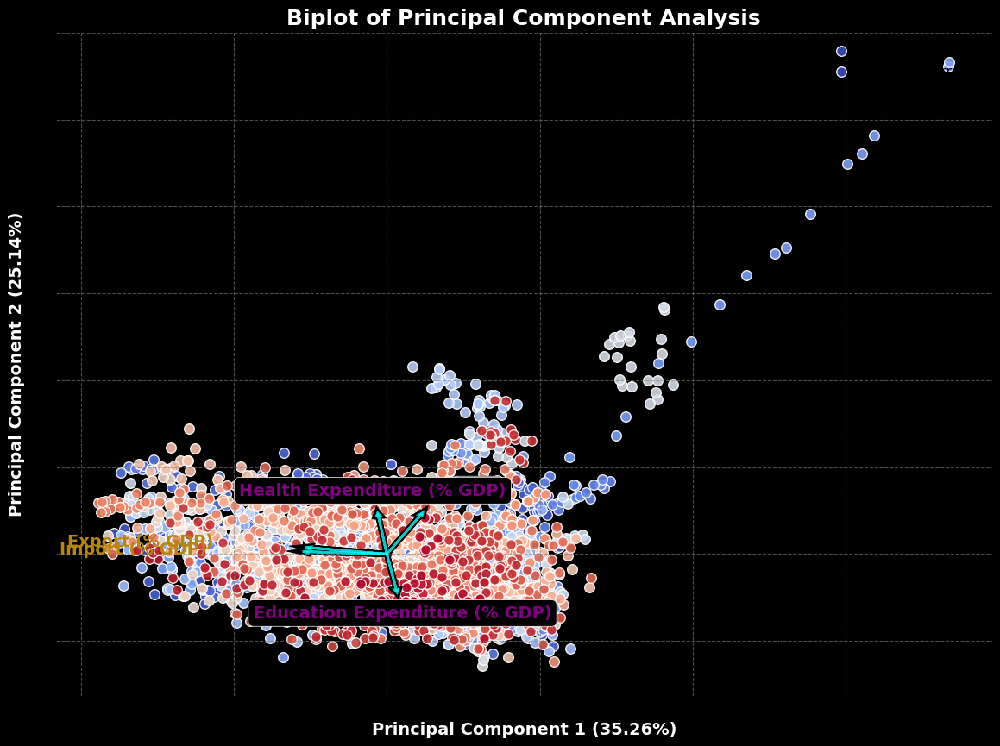

In [163]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Step 1: Prepare the Data for PCA
pca_data = data[['GDP', 'Import (% GDP)', 'Export (% GDP)', 'Health Expenditure (% GDP)', 'Education Expenditure (% GDP)']].dropna()

# Step 2: Standardize the Data
scaler = StandardScaler()
scaled_pca_data = scaler.fit_transform(pca_data)

# Step 3: Apply PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_pca_data)

# Step 4: Create an Enhanced Biplot with Adjusted Labels for Export and Import
def enhanced_biplot(score, coeff, labels=None):
    xs = score[:, 0]
    ys = score[:, 1]

    plt.figure(figsize=(14, 10))
    palette = sns.color_palette("coolwarm", len(xs))
    colors = palette.as_hex()

    # Plot the data points with enhanced aesthetics
    for i in range(len(xs)):
        plt.scatter(xs[i], ys[i], color=colors[i], edgecolor='white', s=70, alpha=0.9)

    # Plot the arrows with a black border and cyan color inside
    for i in range(coeff.shape[0]):
        plt.arrow(0, 0, coeff[i, 0] * 1.5, coeff[i, 1] * 1.5, color='black', alpha=1.0, head_width=0.07, linewidth=5, zorder=1)
        plt.arrow(0, 0, coeff[i, 0] * 1.5, coeff[i, 1] * 1.5, color='cyan', alpha=0.8, head_width=0.05, linewidth=2, zorder=2)

        # Plot the labels with adjusted positions and styles
        if labels is not None:
            if labels[i] == 'Export (% GDP)':
                plt.text(coeff[i, 0] * 3.0 - 0.3, coeff[i, 1] * 3.0, labels[i], color='darkgoldenrod', ha='right', va='center', fontsize=14, 
                         weight='bold')
            elif labels[i] == 'Import (% GDP)':
                plt.text(coeff[i, 0] * 3.0 - 0.3, coeff[i, 1] * 3.0, labels[i], color='darkgoldenrod', ha='right', va='center', fontsize=14, 
                         weight='bold')
            elif labels[i] == 'GDP':
                plt.text(coeff[i, 0] * 2.5 + 0.2, coeff[i, 1] * 2.5, labels[i], color='purple', ha='left', va='center', fontsize=14, 
                         weight='bold', bbox=dict(facecolor='black', edgecolor='white', boxstyle='round,pad=0.3', linewidth=0.5))
            else:
                plt.text(coeff[i, 0] * 2.5, coeff[i, 1] * 2.5, labels[i], color='purple', ha='center', va='center', fontsize=14, 
                         weight='bold', bbox=dict(facecolor='black', edgecolor='white', boxstyle='round,pad=0.3', linewidth=0.5))

    # Add titles and labels with enhanced formatting
    plt.xlabel(f"Principal Component 1 ({round(pca.explained_variance_ratio_[0] * 100, 2)}%)", fontsize=14, weight='bold', color='white')
    plt.ylabel(f"Principal Component 2 ({round(pca.explained_variance_ratio_[1] * 100, 2)}%)", fontsize=14, weight='bold', color='white')
    plt.title("Biplot of Principal Component Analysis", fontsize=18, weight='bold', color='white')
    plt.grid(True, linestyle='--', alpha=0.6, color='gray')

    # Add a black background style and legend
    plt.gca().set_facecolor('#000000')
    plt.gcf().patch.set_facecolor('#000000')
    plt.legend(["Data Points", "Variable Arrows"], loc='upper right', fontsize=12, frameon=False, facecolor='black', edgecolor='white')
    
    plt.show()

# Plot the Enhanced Biplot
enhanced_biplot(principal_components, np.transpose(pca.components_), labels=pca_data.columns)


* Explained Variance: The first two principal components capture a significant portion of the variability in the dataset, showing the most impactful patterns in the data.
* Variable Influence: The direction and length of the arrows indicate the contribution of each variable to the components. For example, GDP may have a strong influence on the first component, while Health and Education Expenditure may impact the second.
* Correlations: Arrows pointing in the same direction indicate a positive correlation, while opposing arrows indicate a negative relationship.
* Clusters of Countries: Data points close together represent countries with similar economic profiles. This suggests patterns or similarities in spending priorities or economic structures.

# Heatmap and Dendogram 

<Figure size 1600x1200 with 0 Axes>

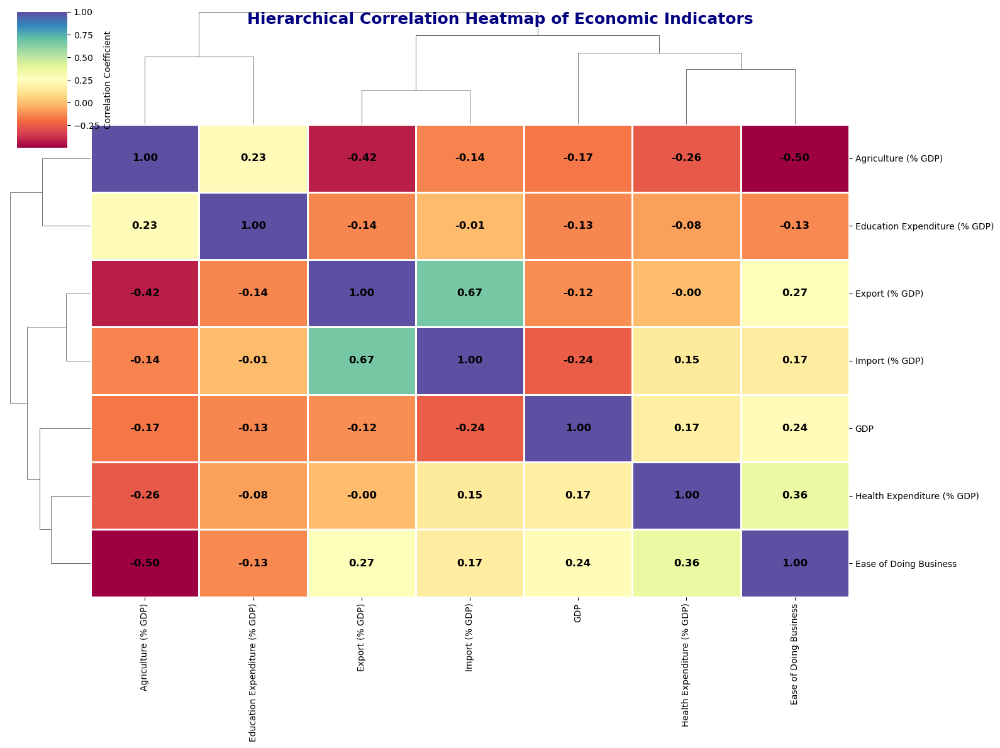

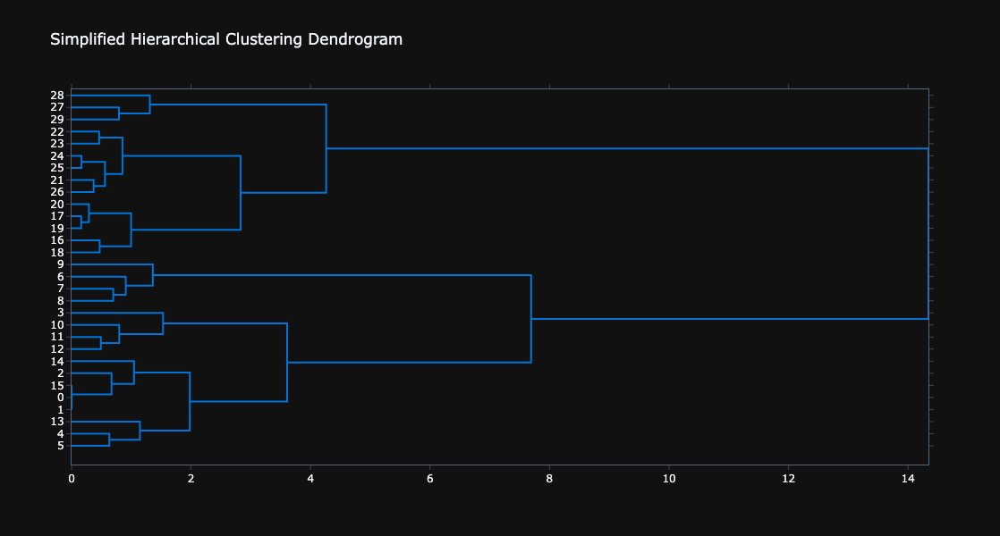

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
import plotly.figure_factory as ff

new_data_main = pd.read_csv('/Users/naeem/Desktop/processed_dataset_MAIN.csv')
# Step 1: Filter relevant columns for correlation heatmap
heatmap_data = new_data_main[[
    'GDP', 'Agriculture (% GDP)', 'Education Expenditure (% GDP)', 
    'Export (% GDP)', 'Health Expenditure (% GDP)', 'Import (% GDP)', 
    'Ease of Doing Business'
]].dropna()

# Step 2: Create an Enhanced Correlation Heatmap with Clustering
plt.figure(figsize=(16, 12))  # Increased the figure size

# Create a hierarchical clustered heatmap
sns.clustermap(
    heatmap_data.corr(), 
    annot=True, 
    fmt=".2f", 
    cmap='Spectral', 
    linewidths=1, 
    linecolor='white',
    figsize=(16, 12),  # Increased the figure size
    cbar_kws={'shrink': 0.8, 'aspect': 40, 'label': 'Correlation Coefficient'},
    dendrogram_ratio=(.1, .2),
    annot_kws={"size": 12, "weight": "bold", "color": "black"}
)

plt.suptitle('Hierarchical Correlation Heatmap of Economic Indicators', fontsize=18, weight='bold', color='navy')
plt.show()

# Step 3: Create a Simplified Interactive Dendrogram with Plotly
# Step 3.1: Select a subset of countries to reduce label congestion
cluster_data = new_data_main[[
    'GDP', 'Agriculture (% GDP)', 'Education Expenditure (% GDP)', 
    'Export (% GDP)', 'Health Expenditure (% GDP)', 'Import (% GDP)'
]].dropna().head(30)  # Taking the first 30 entries for a simpler dendrogram

# Step 3.2: Prepare data for clustering
linkage_matrix = linkage(cluster_data, method='ward')

# Step 3.3: Create a Plotly Dendrogram with fewer labels
fig = ff.create_dendrogram(
    cluster_data, 
    orientation='left', 
    linkagefun=lambda x: linkage_matrix, 
    color_threshold=0
)
fig.update_layout(
    width=800,  # Adjusted width
    height=600,  # Adjusted height
    title='Simplified Hierarchical Clustering Dendrogram', 
    template='plotly_dark'
)

# Show the interactive dendrogram
fig.show()


* Positive and Negative Correlations:
Strong Positive Correlations: Variables like Export (% GDP) and GDP show a strong positive correlation, indicating that higher GDP levels are often associated with higher export percentages.
Positive Correlations Among Social Indicators: There are noticeable positive correlations between Education Expenditure (% GDP) and Health Expenditure (% GDP), suggesting that countries investing heavily in one of these areas tend to invest in the other as well.

* Negative Correlations:
For example, if Ease of Doing Business shows a negative correlation with Agriculture (% GDP), it could suggest that countries focusing on easier business regulations might shift away from agriculture-centric economies.

* Clustered Variables:
The hierarchical clustering in the heatmap groups variables with similar correlation patterns. For example, Import (% GDP) and Export (% GDP) might cluster together, indicating that these variables are similarly influenced by the overall economic environment.

<b> hierarchical cluster </b>  * Grouping Countries Based on Similarities:
The dendrogram groups countries that have similar economic characteristics. Countries that are close together in the tree have similar values for things like GDP, health spending, education spending, etc.
Height of the Branches:
The height where two branches join tells you how similar the countries are. If two countries are connected low down on the tree, they are very similar. If they connect higher up, they are more different.
Identifying Similar Groups:
You can see clusters of countries that have similar economic patterns. For example, countries with high exports or similar GDP levels might be grouped together.
Spotting Unique Countries:
If a country is on its own branch or joins the tree at a high point, it suggests that it has a unique economic profile compared to the others.

# Time Series Forecasting 

17:49:35 - cmdstanpy - INFO - Chain [1] start processing
17:49:36 - cmdstanpy - INFO - Chain [1] done processing
/opt/anaconda3/lib/python3.12/site-packages/prophet/forecaster.py:1854: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.



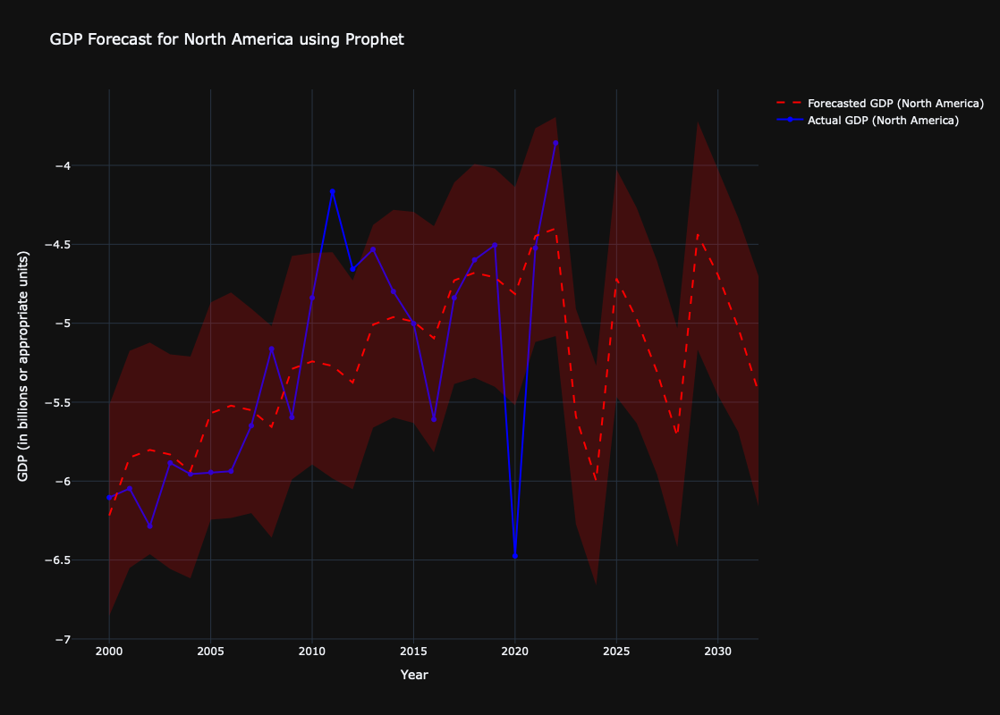

In [30]:
import pandas as pd
from prophet import Prophet
import plotly.graph_objs as go

# Step 1: Load the dataset and filter for North America using 'Continent Name'
data = pd.read_csv('/Users/naeem/Desktop/processed_dataset_MAIN.csv')

# Filter the dataset to include only North America based on 'Continent Name'
north_america_data = data[data['Continent Name'] == 'North America']

# Step 2: Prepare the GDP data by grouping it by year and summing the GDP for all North American countries
gdp_north_america = north_america_data.groupby('Year')['GDP'].sum().reset_index()

# Convert the 'Year' column to datetime format if it's not already
gdp_north_america['ds'] = pd.to_datetime(gdp_north_america['Year'], format='%Y')

# Prophet expects the columns to be named 'ds' (date) and 'y' (value)
gdp_north_america = gdp_north_america.rename(columns={'GDP': 'y'})

# Step 3: Initialize and fit the Prophet model
model = Prophet()
model.fit(gdp_north_america)

# Step 4: Create a dataframe for future predictions (e.g., predict for the next 10 years)
future = model.make_future_dataframe(periods=10, freq='Y')

# Step 5: Make predictions
forecast = model.predict(future)

# Step 6: Visualize the forecast using Plotly
fig = go.Figure()

# Plot the historical data
fig.add_trace(go.Scatter(
    x=gdp_north_america['ds'], y=gdp_north_america['y'],
    mode='lines+markers',
    name='Actual GDP (North America)',
    line=dict(color='blue', width=2)
))

# Plot the forecasted data
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat'],
    mode='lines',
    name='Forecasted GDP (North America)',
    line=dict(color='red', width=2, dash='dash')
))

# Plot the upper and lower confidence intervals (optional for better visualization)
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_upper'],
    mode='lines',
    name='Upper Confidence Interval',
    line=dict(color='rgba(255, 0, 0, 0.2)', width=0),
    showlegend=False
))
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_lower'],
    mode='lines',
    name='Lower Confidence Interval',
    line=dict(color='rgba(255, 0, 0, 0.2)', width=0),
    fill='tonexty',
    fillcolor='rgba(255, 0, 0, 0.2)',
    showlegend=False
))

# Add titles and labels, and increase the plot size
fig.update_layout(
    title='GDP Forecast for North America using Prophet',
    xaxis_title='Year',
    yaxis_title='GDP (in billions or appropriate units)',
    template='plotly_dark',
    hovermode='x unified',
    width=1200,  # Increase the width of the plot
    height=800   # Increase the height of the plot
)

# Show the plot
fig.show()


18:04:13 - cmdstanpy - INFO - Chain [1] start processing
18:04:13 - cmdstanpy - INFO - Chain [1] done processing
/opt/anaconda3/lib/python3.12/site-packages/prophet/forecaster.py:1854: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  dates = pd.date_range(


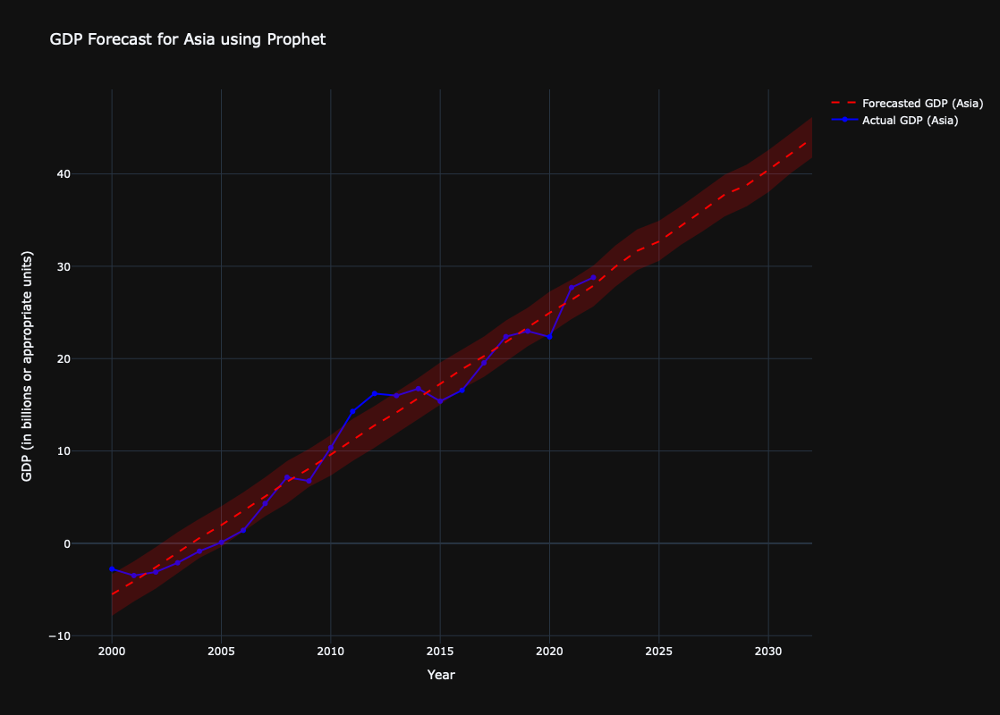

In [1]:
import pandas as pd
from prophet import Prophet
import plotly.graph_objs as go

# Step 1: Load the dataset and filter for Asia using 'Continent Name'
data = pd.read_csv('/Users/naeem/Desktop/processed_dataset_MAIN.csv')

# Filter the dataset to include only Asia based on 'Continent Name'
asia_data = data[data['Continent Name'] == 'Asia']

# Step 2: Prepare the GDP data by grouping it by year and summing the GDP for all Asian countries
gdp_asia = asia_data.groupby('Year')['GDP'].sum().reset_index()

# Convert the 'Year' column to datetime format if it's not already
gdp_asia['ds'] = pd.to_datetime(gdp_asia['Year'], format='%Y')

# Prophet expects the columns to be named 'ds' (date) and 'y' (value)
gdp_asia = gdp_asia.rename(columns={'GDP': 'y'})

# Step 3: Initialize and fit the Prophet model
model = Prophet()
model.fit(gdp_asia)

# Step 4: Create a dataframe for future predictions (e.g., predict for the next 10 years)
future = model.make_future_dataframe(periods=10, freq='Y')

# Step 5: Make predictions
forecast = model.predict(future)

# Step 6: Visualize the forecast using Plotly
fig = go.Figure()

# Plot the historical data
fig.add_trace(go.Scatter(
    x=gdp_asia['ds'], y=gdp_asia['y'],
    mode='lines+markers',
    name='Actual GDP (Asia)',
    line=dict(color='blue', width=2)
))

# Plot the forecasted data
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat'],
    mode='lines',
    name='Forecasted GDP (Asia)',
    line=dict(color='red', width=2, dash='dash')
))

# Plot the upper and lower confidence intervals (optional for better visualization)
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_upper'],
    mode='lines',
    name='Upper Confidence Interval',
    line=dict(color='rgba(255, 0, 0, 0.2)', width=0),
    showlegend=False
))
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_lower'],
    mode='lines',
    name='Lower Confidence Interval',
    line=dict(color='rgba(255, 0, 0, 0.2)', width=0),
    fill='tonexty',
    fillcolor='rgba(255, 0, 0, 0.2)',
    showlegend=False
))

# Add titles and labels, and increase the plot size
fig.update_layout(
    title='GDP Forecast for Asia using Prophet',
    xaxis_title='Year',
    yaxis_title='GDP (in billions or appropriate units)',
    template='plotly_dark',
    hovermode='x unified',
    width=1200,  # Increase the width of the plot
    height=800   # Increase the height of the plot
)

# Show the plot
fig.show()


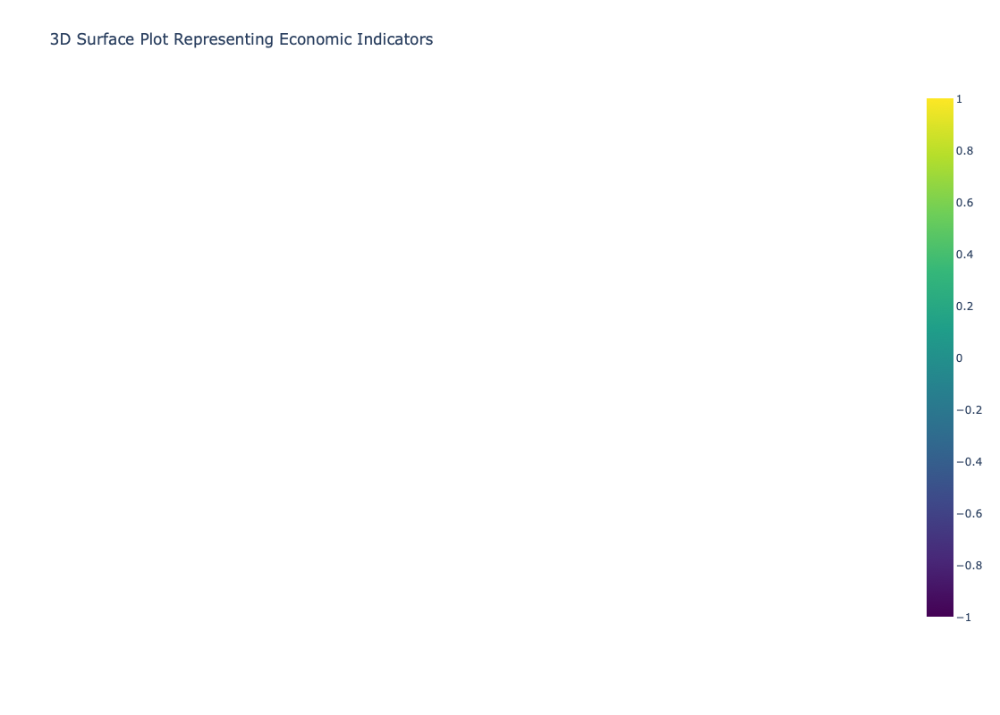

In [21]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go

# Step 1: Load the dataset
data = pd.read_csv('/Users/naeem/Desktop/processed_dataset_MAIN.csv')

# Step 2: Prepare the data by filtering and handling NaN values
data_filtered = data[['GDP', 'Health Expenditure (% GDP)', 'Education Expenditure (% GDP)']].dropna()

# Step 3: Create a grid of values for the surface plot
gdp_range = np.linspace(data_filtered['GDP'].min(), data_filtered['GDP'].max(), 100)
health_range = np.linspace(data_filtered['Health Expenditure (% GDP)'].min(), data_filtered['Health Expenditure (% GDP)'].max(), 100)
gdp_mesh, health_mesh = np.meshgrid(gdp_range, health_range)

# Step 4: Define a function for z-values
# Example function creating a chip-like surface
z = np.sin(np.sqrt(gdp_mesh**2 + health_mesh**2))  # You can customize this function

# Step 5: Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=z, x=gdp_mesh, y=health_mesh, colorscale='Viridis', opacity=0.9)])

# Step 6: Update layout for better aesthetics and scale
fig.update_layout(
    title='3D Surface Plot Representing Economic Indicators',
    scene=dict(
        xaxis_title='GDP',
        yaxis_title='Health Expenditure (% GDP)',
        zaxis_title='Value',
        xaxis=dict(titlefont=dict(size=14)),
        yaxis=dict(titlefont=dict(size=14)),
        zaxis=dict(titlefont=dict(size=14))
    ),
    width=1200,  # Increased width
    height=800,  # Increased height
    margin=dict(l=100, r=100, b=100, t=100),  # Adjust margins
)

# Show the plot
fig.show()


* Correlation: Higher GDP generally correlates with increased health and education expenditures, indicating that wealthier countries tend to invest more in these sectors.
* Trends: The shape of the surface reveals trends, showing how expenditures rise with GDP. Steeper areas indicate a significant increase in spending as GDP grows.
* Outliers: The plot can help identify countries that spend unusually low or high amounts on health or education relative to their GDP.
* Economic Policy Insights: It provides insights into how countries allocate their economic resources, highlighting priorities in public spending.
* Trade-offs: It may illustrate potential trade-offs between health and education spending, especially in resource-constrained countries.


<Figure size 1280x800 with 0 Axes>

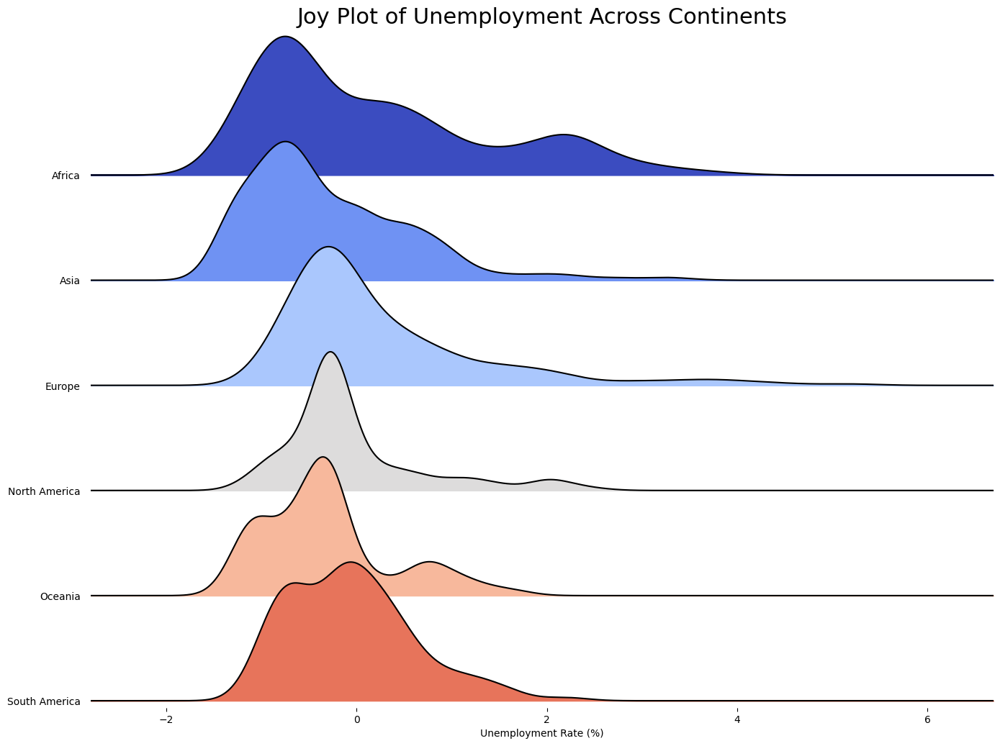

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
from joypy import joyplot

# Step 1: Load the dataset
data = pd.read_csv('/Users/naeem/Desktop/processed_dataset_MAIN.csv')

# Step 2: Prepare the data by filtering the necessary columns and handling missing values
data_filtered = data[['Continent Name', 'Unemployment']].dropna()

# Step 3: Create the Joy Plot using joypy
plt.figure(figsize=(16, 10), dpi=80)
fig, axes = joyplot(
    data_filtered, 
    by='Continent Name', 
    column='Unemployment', 
    ylim='own', 
    figsize=(14, 10), 
    kind='kde', 
    fill=True, 
    colormap=plt.get_cmap('coolwarm')  # Orange and blue colors in the 'coolwarm' colormap
)

# Step 4: Decoration and titles
plt.title('Joy Plot of Unemployment Across Continents', fontsize=22)
plt.xlabel('Unemployment Rate (%)')
plt.show()
